# Build nonlinear models from time series data

Build nonlinear time series models from scalar time series data using minimum description length radila basis function formalism. This notebook is adapted from that in the github repo ``m-small/place``. For the sake of simplicity, I have also copied over the relevant ``*.jl`` files from the ``m-small/place`` repo to this one. In general, though, place will be the place to get the most up to date and function code. The code here serves to illustrate the process without multiple repositories.

## Sample data

First we generate some typical test data to play with --- I've simplified this a bit with the contents of ``ChaosFunctions.jl`` 

In [1]:
include("from_place/ChaosFunctions.jl")

addnoise (generic function with 1 method)

In [2]:
using Plots

In [3]:
z=lorenzpoints(5000,0.05)

3×5001 Array{Float64,2}:
 -9.3954   -9.11588  -8.65294  -8.14648  …   0.348011  -0.90338  -1.72562
 -9.09342  -8.3313   -7.63451  -7.18491     -2.88828   -2.83896  -3.19333
 28.5537   28.7701   28.4925   27.8354      24.9674    21.8964   19.3518

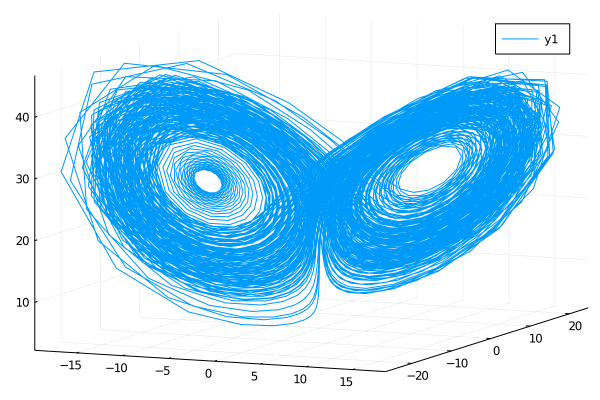

In [4]:
plot(z[1,:],z[2,:],z[3,:])

In [5]:
z=rosslerpoints(5000,0.2)

3×5001 Array{Float64,2}:
 -2.09051    -1.75877    -1.34197   …  -0.459284  -1.49662   -2.20517
 -1.45337    -1.90718    -2.303         3.23109    3.15526    2.90361
  0.0252208   0.0261013   0.027361      3.509      0.936751   0.227118

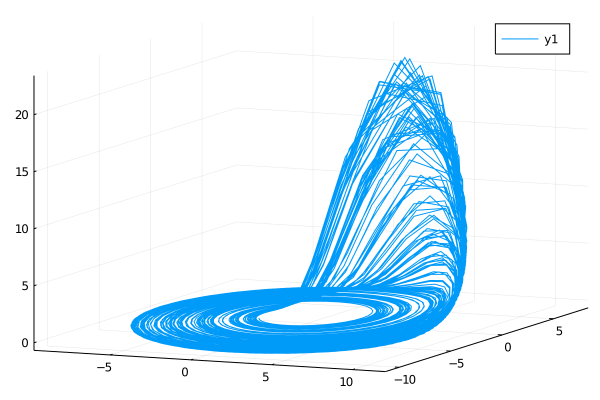

In [6]:
plot(z[1,:],z[2,:],z[3,:])

In [7]:
z=itmap(tinkerbell,-[0.7, 0.6],10000)

2×10000 Array{Float64,2}:
 -0.106024  -0.00524985   0.0848639  …  -0.0789416  -0.43416   -0.148745
 -0.407701  -0.329446    -0.171764      -0.978687   -0.492709  -0.686846

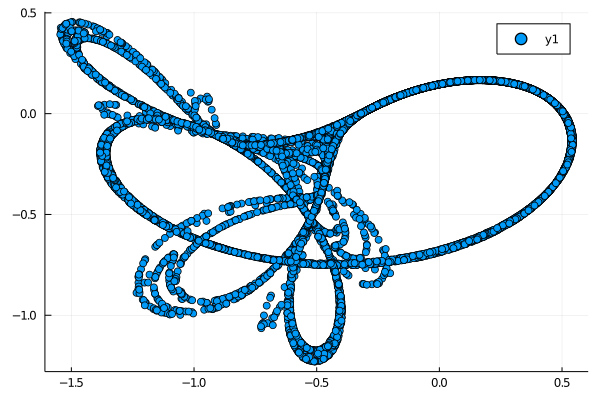

In [8]:
plot(z[2,:],z[1,:],linetype=:dots)

In [9]:
zn=addnoise(z,0.05)

2×10000 Array{Float64,2}:
 -0.0842045  -0.000612172   0.0872222  …  -0.103914  -0.416186  -0.150217
 -0.409797   -0.307256     -0.182273      -0.957424  -0.519661  -0.692787

Note that in these examples, we add observational noise to the raw data. This is because if the data has no noise (or rather, just noise at machine precision) the modeling package and description length are too smart, figure this out and consequently build a really really big model. Thesurface fitting task (i.e. the model building bit)actually also becomes trivial if one has enough clean and smooth data. This is part of the reason that machine learning and time series modelling journals are full of unbelievably good predicitons that just don't match up to the real world...

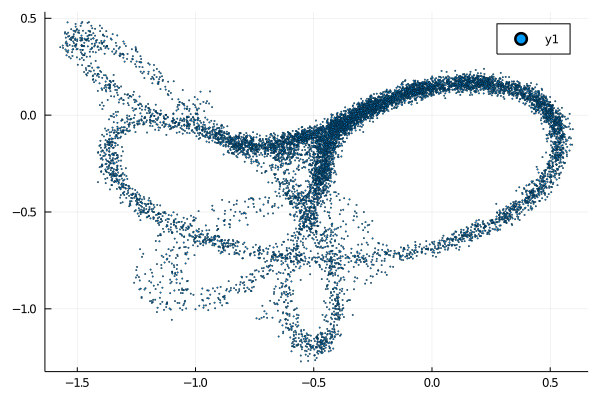

In [10]:
plot(zn[2,:],zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

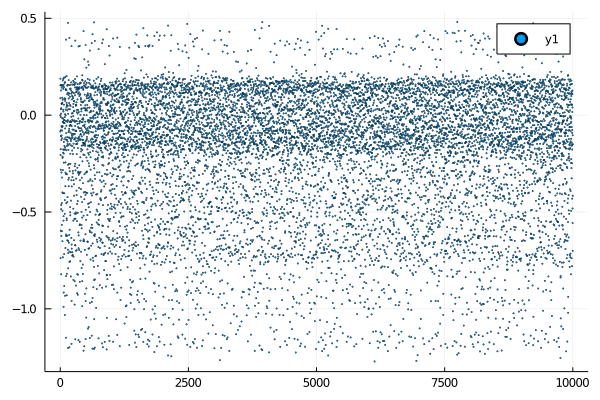

In [11]:
plot(zn[1,:],linetype=:dots,markersize=1,markerstrokewidth=0.5)

In [12]:
z=itmap(logistic,1/π,10^4);

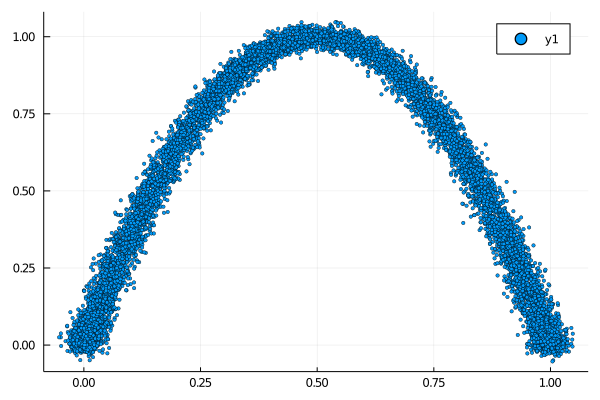

In [13]:
z=itmap(logistic,1/π,10^4);
zn=addnoise(z,0.05)
plot(zn[1:end-1],zn[2:end],linetype=:dots,markersize=2,markerstrokewidth = 0.5)

## Build the model

Import the modelling code, and away we go.

In [14]:
include("from_place/BasisFunctionTypes.jl")
include("from_place/Place.jl")

Main.Place

Any valid inline function can be used as a penlaty function (it must operate on globally defined functions in `Place.topdown` and must return a scalar, the algorithm seeks a minimum of this function. Four useful examples follow (description length ala `Rissanen` requires extra computation in the main code to account for parameter precisions.

In [15]:
#need to make these variables in scope of the current WS
nx=Int64(length(z))
mss=Float64(Inf)
λ=Array{Float64,1}[]
δ=Array{Float64,1}[]
#valid penalty criteria
Schwarz = :(nx*log(mss)+nk*log(nx))
Akaike = :(nx*log(mss)+2*nk)
Rissanen = :(description(mss,λ,δ,nx)) #Rissanen desciption length
Model30 = :(-nk*(nk<=30))
#nx is # of observation (length of data)
#nk is # of parameters (basis functions in model)
#mss is the mean-sum-square model prediction error
#λ are the model parameters and δ their precisions

:(-nk * (nk <= 30))

Next, the dictionary `options` defined model structure and optional modelling parameters (it'll run a produce something even if `options` is empty, but it might be better to populate this somewhat intelligently. A useful example to model the (admittedly rather simple) logistic map is provided

In [16]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

And, then, away we go...

In [17]:
mymodel, X, zout, mdlv = Place.buildmodel(zn,options)

dx=4, nx=7999
needδ=true
*MSS=0.12402219758157201 DL=3006.444564821968 size=1
*MSS=0.021671365604169292 DL=-3969.6386562508874 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=0.009264264559363673 DL=-7363.140037008832 size=2
*MSS=0.008863998609956954 DL=-7531.492271586179 size=3
*MSS=0.006255059301720362 DL=-8924.225062514048 size=3
*MSS=0.006043878964904426 DL=-9055.47749961006 size=4
*MSS=0.005749696261959881 DL=-9249.338970856776 size=5
*MSS=0.0055601449162897216 DL=-9376.197992656138 size=6
*MSS=0.005327031726073601 DL=-9540.882239293065 size=7
*MSS=0.00339506192351482 DL=-11343.03026219393 size=7
*MSS=0.002719659894093536 DL=-12228.994676613083 size=7
*MSS=0.002563790573478739 DL=-12464.578089788512 size=7
*MSS=0.002481868054121922 DL=-12593.975291233932 size=7
MSS=0.0026338539968083666 DL=-12355.73853715329 size=7
*MSS=0.0024369573099141365 DL=-12661.15309774119 size=8
*MSS=0.0024240754572386037 DL=-12680.912366892124 size=8
*MSS=0.002249560462639442 DL=-

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [1], 0.1875388729789112, [0.8463347243183486 0.21057482186384843 … 0.34886264631886127 0.045990604643432555], [3.9846972800082163]), Main.Place.BasisFunc(tophat, [0], 0.4179074147627826, [0.4907713557736737 0.7072220254003918 … 0.9523772866389839 0.15093516281187497], [4.041333366399119]), Main.Place.BasisFunc(tophat, [0], 0.1364447716920277, [0.4907713557736737 0.7072220254003918 … 0.9523772866389839 0.15093516281187497], [2.988693834606738]), Main.Place.BasisFunc(tophat, [1], 0.357949037433803, [0.8463347243183486 0.21057482186384843 … 0.34886264631886127 0.045990604643432555], [3.6299505071394003]), Main.Place.BasisFunc(gaussian, [1], 0.09227883478279482, [0.8463347243183486 0.21057482186384843 … 0.34886264631886127 0.045990604643432555], Any[]), Main.Place.BasisFunc(tophat, [0], 0.22461286860310786, [0.4907713557736737 0.7072220254003918 … 0.9523772866389839 0.15093516281187497], [4.391458693353548]), Main.Pla

Modelling done, we can make one-step predictions on time series data. First, this is the description length computed from the modeling package as a function of model size for increasing number of basis functions.

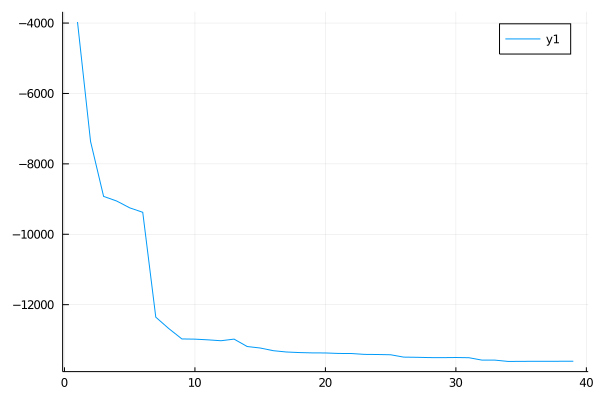

In [18]:
plot(mdlv)

And now nonlinear predictions --- although these are $"honest"$ predictions (in the sense that they are predictions on previously unseen data), you still need to treat this with a bit of caution. Predicting one (or a small number) of steps aheads is generally pretty easy and will give results that look pretty good.

In [19]:
yt,yp,ep = Place.predict(mymodel, z);

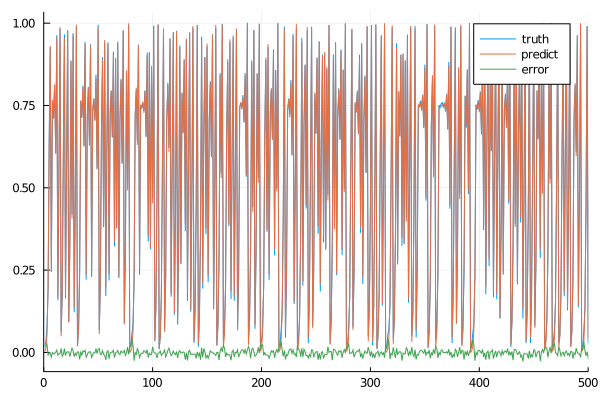

In [20]:
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

A better test is the so=called "$free-run$" simulations. The difference here is that we are iterating the predictions to predict further ahead - we don't use new information as the prediction proceeds. This is also a test of whether the model cpatures the system dynamics --- does the free run prediction look like a genuine trajectory of the original system (we can perform a time delay embedding on the free run and should get an attractor that looks like the original)? In fact, we should be able to estimate invariants (such as correlation dimension) from these free run predicitons and get something that looks close to the same quantity estimated from the original system.

In [21]:
yp, yt = Place.freerun(mymodel,zn,500)

([0.035787669041885684, 0.10803080733349403, 0.3639060650706976, 0.938290110900953, 0.24128067975689588, 0.734552695210239, 0.7866096057787195, 0.6752772769589463, 0.888543955757448, 0.39430119740002856  …  0.6917016231904479, 0.8636006172019094, 0.4729339713582324, 0.9970836313066761, 0.010885904686567255, 0.05417905119532783, 0.18745900057994014, 0.610093785093955, 0.9515232690049954, 0.17386200100298624], [-0.0006143178169294009, 0.010313851313685908, 0.038566662606301955, 0.19249988318720143, 0.61721594530121, 0.9387339176492187, 0.291473255621024, 0.7797543945564935, 0.7138009075936329, 0.7910489845990184  …  0.1547432134163631, 0.45363125841632923, 0.9969395744549966, -0.0011845032777995702, -0.0033114334026883383, 0.022484171618984874, 0.14702380498397533, 0.44943796829853977, 0.9998611421902945, 0.045179830736980627])

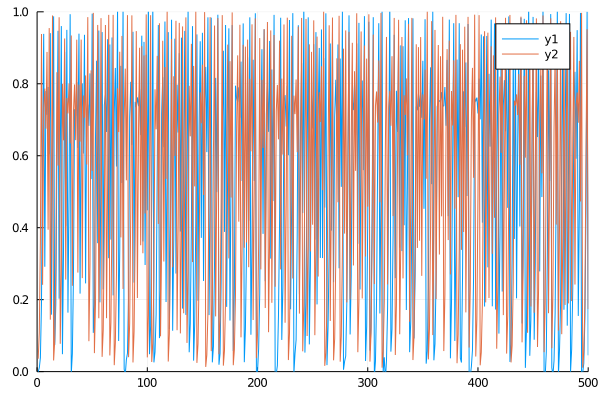

In [22]:
plot(yt)
plot!(yp,ylimit=(0,1),xlimit=(0,500))


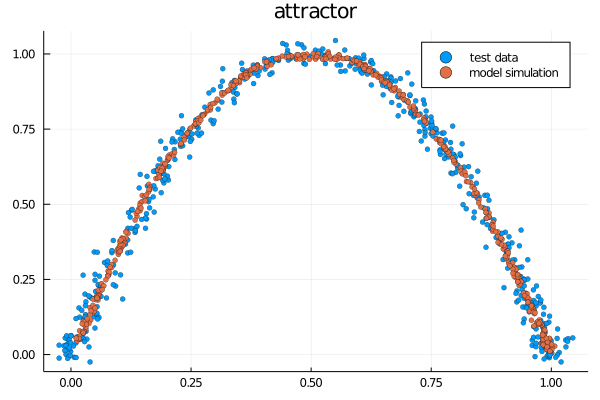

In [23]:
plot(yt[1:end-1],yt[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-1],yp[2:end],linetype=:dots,markersize=3,markerstrokewidth = 0.3,label="model simulation",title="attractor")

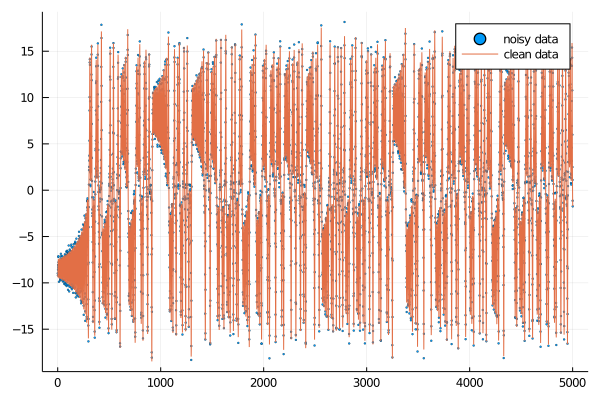

In [24]:
z=lorenzpoints(5000,0.05)
y=z[1,:]
yn=addnoise(y,0.05)
plot(yn,linetype=:dots,markersize=1.2,markerstrokewidth = 0.3,label="noisy data")
plot!(y,label="clean data")

In [25]:
options=Dict("stopstep"=>10,
    "testdatum"=> 8000,
    "functions"=> (gaussian,tophat),
    "embedding" => Place.vembed([0,1,2,3,6,12]),
 #   "embedding" => ([0, 1], [0, 1, 2, 3]),
    "penalty"=> Rissanen,
    "nneighbours"=> 1
    )

Dict{String,Any} with 6 entries:
  "penalty"     => :(description(mss, λ, δ, nx))
  "stopstep"    => 10
  "embedding"   => ([0], [1], [0, 1], [2], [0, 2], [1, 2], [0, 1, 2], [3], [0, …
  "testdatum"   => 8000
  "functions"   => (gaussian, tophat)
  "nneighbours" => 1

In [26]:
mymodel, X, zout, mdlv = Place.buildmodel(yn,options)

dx=13, nx=4488
needδ=true
*MSS=4.624597458497694 DL=9808.624740178777 size=1
WARNING Qδ=1/δ has no exact solution in 2-D case - giving up
*MSS=3.064194934034181 DL=8889.9950561354 size=2
*MSS=2.737953577748804 DL=8643.051533011027 size=3
*MSS=2.68272766092411 DL=8602.625627970514 size=4
*MSS=1.599238283297043 DL=7443.3775873519435 size=4
MSS=1.5969031507686093 DL=7446.55714672392 size=5
*MSS=1.5946821158087043 DL=7443.039538548538 size=5
*MSS=1.5588059521686457 DL=7390.553069887439 size=5
*MSS=1.551453851577541 DL=7385.703964827722 size=6
*MSS=1.5472561484675083 DL=7379.392038900795 size=6
*MSS=1.39151560114948 DL=7139.792448934851 size=6
*MSS=1.3779428623258214 DL=7124.079412351047 size=7
*MSS=1.3399245353274292 DL=7060.659746754992 size=7
*MSS=1.3232221833878448 DL=7038.658512901147 size=8
MSS=1.3251751305569757 DL=7041.642920252885 size=8
MSS=1.3217475366428564 DL=7042.417859149841 size=9
*MSS=1.1108763410714066 DL=6653.340445602033 size=9
*MSS=1.0932672698229264 DL=6624.00360761028

(Main.Place.PlaceModel(Main.Place.BasisFunc[Main.Place.BasisFunc(tophat, [2, 3, 6], 6.0780910584428645, [-13.230697103185733 -1.3165788224618629 … 3.0379495280968873 -3.4600831227742317; -11.387457613692217 -1.8486584775828974 … 1.723200420706109 -2.970683360064894; -5.5240673087662495 -4.583920414987575 … 2.2327715916548097 3.7168319552789404], [4.344296904370681]), Main.Place.BasisFunc(tophat, [2, 6, 12], 9.777140759442899, [-13.230697103185733 -1.3165788224618629 … 3.0379495280968873 -3.4600831227742317; -5.5240673087662495 -4.583920414987575 … 2.2327715916548097 3.7168319552789404; 5.746443101921992 -9.408967375722755 … 13.19340392685721 7.013633677459571], [4.474765473090356]), Main.Place.BasisFunc(gaussian, [2], 5.476796826556272, [-13.230697103185733 -1.3165788224618629 … 3.0379495280968873 -3.4600831227742317], Any[]), Main.Place.BasisFunc(tophat, [1, 3], 10.155795037227625, [-12.071121553198969 -1.6270894615921627 … 3.5451521334905935 -5.2181008702581; -11.387457613692217 -1.8

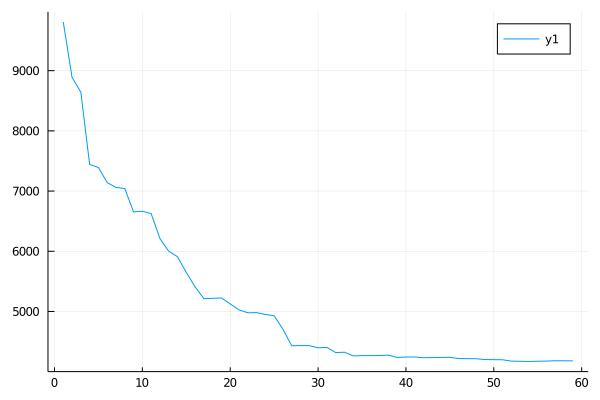

In [27]:
plot(mdlv)

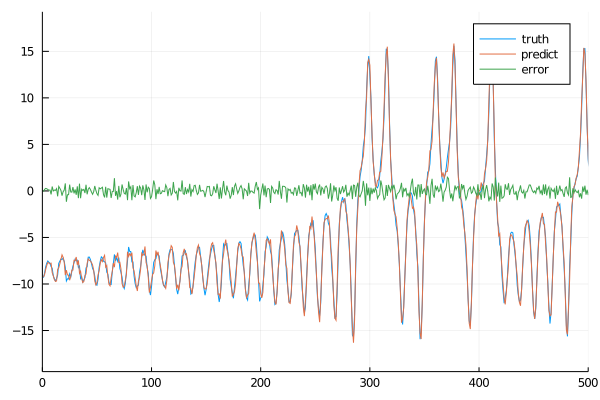

In [28]:
yt,yp,ep = Place.predict(mymodel, yn);
plot(yt,label="truth")
plot!(yp,label="predict")
plot!(ep,label="error",xlimit=(0,500))

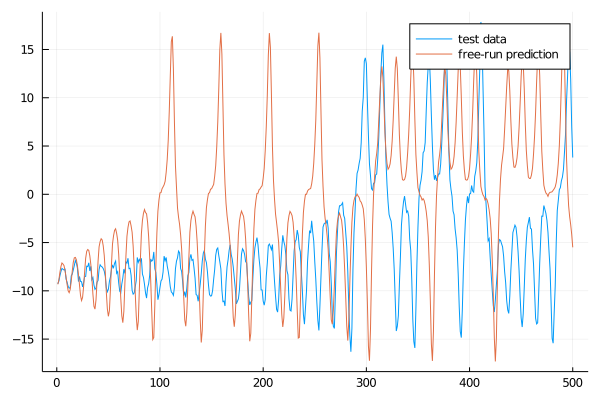

In [29]:
yp, yt = Place.freerun(mymodel,yn,500)
plot(yt,label="test data")
plot!(yp,label="free-run prediction")

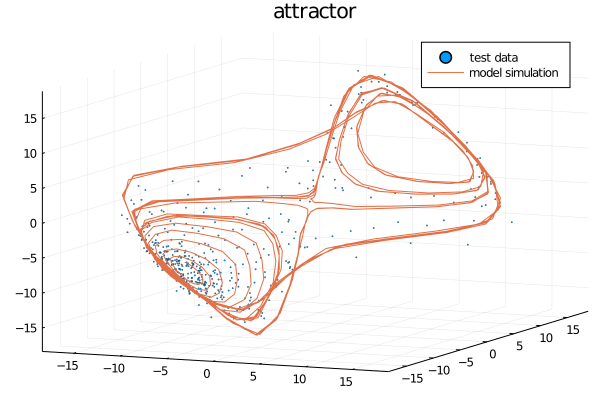

In [30]:
plot(yt[1:end-6],yt[4:end-3],yt[7:end],linetype=:dots,markersize=1,markerstrokewidth = 0.3,label="test data")
plot!(yp[1:end-6],yp[4:end-3],yp[7:end],label="model simulation",title="attractor")

## Michael Small, 20/4/21